# Reading Data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!pip install ultralytics roboflow
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git flash-attn

from roboflow import Roboflow
rf = Roboflow(api_key="1C3Nu6wZnUXZSHy7WI2Y")
project = rf.workspace("kp-internal").project("human-action-recognition-ygolw-teny4")
version = project.version(1)
dataset = version.download("yolov12")

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.9/86.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 102.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 97.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 126.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 99.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 64.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━


Extracting Dataset Version Zip to Human-Action-Recognition-1 in yolov12:: 100%|██████████| 16688/16688 [00:03<00:00, 4238.69it/s]


# Importing Libraries

In [2]:
import os
import cv2
import glob
import yaml
import random
import pathlib
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
from tqdm import tqdm
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm.notebook import trange, tqdm
from IPython.display import Image, Video, display
from sklearn.metrics import precision_score, recall_score
import warnings
!wandb disabled
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.
W&B disabled.


# Discription File For The Custom Dataset

In [3]:
%cd {dataset.location}

train_path = os.path.join(dataset.location, 'train/images')
val_path = os.path.join(dataset.location, 'valid/images')
test_path = os.path.join(dataset.location, 'test/images')

yaml_content = f"""
path: {dataset.location}
train: {train_path}
val: {val_path}
test: {test_path}

nc: 6
names: ['stand', 'walk', 'interact', 'run', 'sit', 'steal']
"""

output_yaml_path = '/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/data.yaml'
os.makedirs(os.path.dirname(output_yaml_path), exist_ok=True)

with open(output_yaml_path, 'w') as file:
    file.write(yaml_content)

color_code = "\033[38;2;163;196;243m"
reset_code = "\033[0m"
print(f"{color_code}YAML file has been saved to {output_yaml_path}{reset_code}")

/content/Human-Action-Recognition-1
YAML file has been saved to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/data.yaml


In [4]:
with open(output_yaml_path, 'r') as file:
    data = yaml.safe_load(file)
class_names = data['names']
print(f"{color_code}Class Names:{reset_code} {class_names}")

Class Names: ['stand', 'walk', 'interact', 'run', 'sit', 'steal']


In [5]:
from PIL import Image as PILImage

image_files = [f for f in os.listdir(train_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
random_image_file = random.choice(image_files)
random_image_path = os.path.join(train_path, random_image_file)
image = PILImage.open(random_image_path)

print(f"Random Image: {random_image_file}")
print(f"Image Size: {image.size}")
print(f"Image Mode: {image.mode}")
print(f"Number of Channels: {len(image.getbands())}")

Random Image: istockphoto-917895882-612x612-1-_jpg.rf.53660768ff128a06bbac84d13c9f5bbf.jpg
Image Size: (612, 408)
Image Mode: RGB
Number of Channels: 3


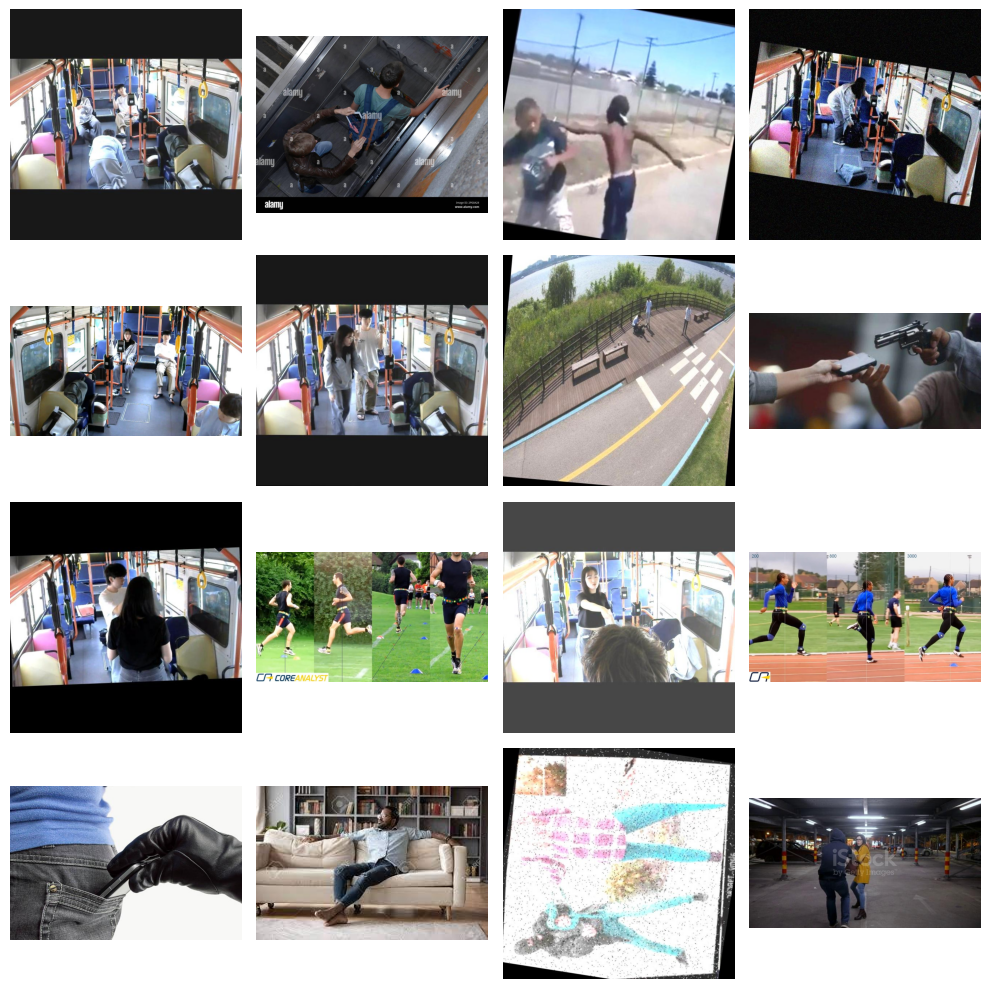

In [6]:
image_files = [f for f in os.listdir(train_path) if f.endswith('.jpg')]
selected_images = random.sample(image_files, 16)
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    img_path = os.path.join(train_path, selected_images[i])
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()

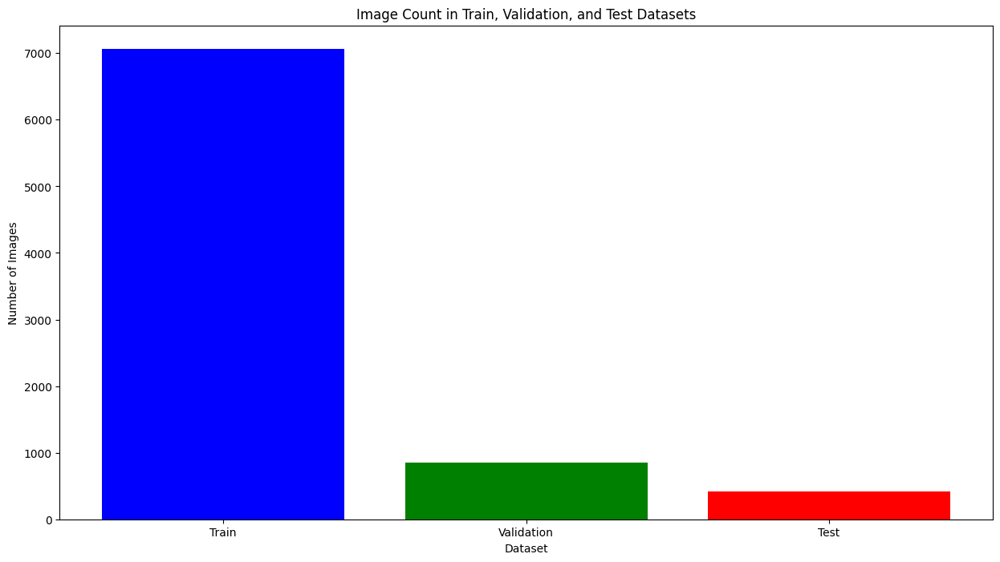

In [7]:
train_count = len(os.listdir(train_path))
valid_count = len(os.listdir(val_path))
test_count = len(os.listdir(test_path))

data_counts = {'Train': train_count, 'Validation': valid_count, 'Test': test_count}

plt.figure(figsize=(15, 8))
plt.bar(data_counts.keys(), data_counts.values(), color=['blue', 'green', 'red'])
plt.xlabel('Dataset')
plt.ylabel('Number of Images')
plt.title('Image Count in Train, Validation, and Test Datasets')
plt.show()

# Training

In [8]:
project_save_dir = '/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/'

finalmodel = YOLO('yolov12s.yaml').load('yolov12s.pt')

Result_finalmodel = finalmodel.train(
    data=output_yaml_path,
    epochs=30,
    imgsz=640,
    optimizer="Adam",
    patience=10,
    batch=16,
    lr0=0.0001,
    dropout=0.1,
    project=project_save_dir
)

100%|██████████| 17.8M/17.8M [00:00<00:00, 58.9MB/s]


Transferred 739/739 items from pretrained weights
New https://pypi.org/project/ultralytics/8.3.169 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov12s.yaml, data=/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/data.yaml, epochs=30, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/, name=train, exist_ok=False, pretrained=yolov12s.pt, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, 

100%|██████████| 755k/755k [00:00<00:00, 121MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2, 1, 2]          
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1     37120  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2, 1, 4]        
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  2    677120  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 4]        
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.26M/5.26M [00:00<00:00, 308MB/s]


AMP: checks passed ✅


train: Scanning /content/Human-Action-Recognition-1/train/labels... 7063 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7063/7063 [00:03<00:00, 2206.85it/s]


train: New cache created: /content/Human-Action-Recognition-1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 4, len(boxes) = 10907. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Human-Action-Recognition-1/valid/labels... 851 images, 0 backgrounds, 0 corrupt: 100%|██████████| 851/851 [00:01<00:00, 756.51it/s]


val: New cache created: /content/Human-Action-Recognition-1/valid/labels.cache
Plotting labels to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/train/labels.jpg... 
optimizer: Adam(lr=0.0001, momentum=0.937) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.77G      1.195      1.962      1.433         27        640: 100%|██████████| 442/442 [04:16<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.64it/s]

                   all        851       1411      0.769      0.781      0.817       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      6.84G       1.08      1.178      1.331         24        640: 100%|██████████| 442/442 [04:10<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.30it/s]

                   all        851       1411      0.759      0.839      0.847      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      6.67G      1.062      1.058      1.326         17        640: 100%|██████████| 442/442 [04:06<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.18it/s]

                   all        851       1411      0.805      0.783      0.833      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      6.66G      1.032      1.018      1.317         24        640: 100%|██████████| 442/442 [04:02<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:14<00:00,  1.85it/s]

                   all        851       1411      0.814      0.823      0.868      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      6.82G          1     0.9266      1.288         14        640: 100%|██████████| 442/442 [04:06<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.22it/s]

                   all        851       1411      0.825      0.843      0.877      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      6.66G     0.9853      0.879      1.282         41        640: 100%|██████████| 442/442 [04:03<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  1.93it/s]

                   all        851       1411      0.836      0.854       0.89      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      6.82G     0.9652      0.849      1.261         34        640: 100%|██████████| 442/442 [04:12<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.03it/s]

                   all        851       1411       0.85      0.858      0.892      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      6.66G     0.9409     0.8196      1.254         28        640: 100%|██████████| 442/442 [04:03<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.11it/s]

                   all        851       1411       0.83      0.849      0.886      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      6.84G     0.9371     0.7895      1.249         22        640: 100%|██████████| 442/442 [04:02<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:14<00:00,  1.90it/s]

                   all        851       1411      0.847      0.846      0.888      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      6.66G     0.9245     0.7734      1.236         24        640: 100%|██████████| 442/442 [04:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.15it/s]

                   all        851       1411      0.837      0.855      0.889      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      6.82G     0.8987     0.7352      1.221         22        640: 100%|██████████| 442/442 [04:08<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.12it/s]

                   all        851       1411      0.856      0.849      0.886      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      6.66G     0.8788     0.7082      1.211         20        640: 100%|██████████| 442/442 [04:05<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.11it/s]

                   all        851       1411      0.852      0.864      0.894      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      6.82G     0.8699     0.6944      1.197         17        640: 100%|██████████| 442/442 [04:06<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.07it/s]

                   all        851       1411      0.855      0.843      0.891      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      6.68G     0.8501     0.6882      1.189         40        640: 100%|██████████| 442/442 [04:05<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.06it/s]

                   all        851       1411      0.861      0.854      0.894      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      6.82G     0.8345     0.6546      1.178         28        640: 100%|██████████| 442/442 [04:03<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.10it/s]

                   all        851       1411      0.874      0.853      0.902      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      6.66G     0.8209     0.6375      1.166         35        640: 100%|██████████| 442/442 [04:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.14it/s]

                   all        851       1411      0.864      0.856       0.89      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      6.82G     0.8129      0.626      1.154         30        640: 100%|██████████| 442/442 [04:02<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.42it/s]

                   all        851       1411      0.864      0.854      0.895      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      6.66G     0.8084     0.6032       1.15         25        640: 100%|██████████| 442/442 [04:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.43it/s]

                   all        851       1411      0.879      0.862      0.897      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      6.82G      0.788     0.5883      1.152         19        640: 100%|██████████| 442/442 [04:05<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.11it/s]

                   all        851       1411      0.868      0.868      0.903      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      6.68G      0.781      0.587       1.14         17        640: 100%|██████████| 442/442 [04:01<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.11it/s]

                   all        851       1411      0.875      0.867      0.898      0.682


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      6.85G     0.6729     0.4348      1.068         10        640: 100%|██████████| 442/442 [04:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.09it/s]

                   all        851       1411      0.862       0.84      0.887       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      6.66G      0.651     0.4139      1.039          8        640: 100%|██████████| 442/442 [04:06<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:11<00:00,  2.27it/s]

                   all        851       1411      0.861      0.869      0.903      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      6.82G     0.6338     0.3971      1.027         13        640: 100%|██████████| 442/442 [04:06<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.08it/s]

                   all        851       1411       0.88      0.853        0.9      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      6.66G     0.6149     0.3878      1.013         12        640: 100%|██████████| 442/442 [04:02<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.15it/s]

                   all        851       1411      0.855      0.875      0.901      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      6.82G     0.5924      0.371     0.9959          8        640: 100%|██████████| 442/442 [04:05<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.17it/s]


                   all        851       1411      0.875      0.876      0.909      0.689

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      6.66G     0.5766      0.358     0.9905          7        640: 100%|██████████| 442/442 [04:06<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.02it/s]

                   all        851       1411       0.87      0.864        0.9      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      6.82G      0.564     0.3488     0.9921         11        640: 100%|██████████| 442/442 [04:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.19it/s]

                   all        851       1411      0.884      0.861      0.895      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      6.66G     0.5448     0.3352     0.9767          9        640: 100%|██████████| 442/442 [04:07<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:13<00:00,  2.04it/s]


                   all        851       1411      0.878      0.864      0.895       0.69

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      6.82G     0.5396     0.3319     0.9767          9        640: 100%|██████████| 442/442 [04:04<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.20it/s]

                   all        851       1411      0.875      0.859      0.895      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      6.66G     0.5268     0.3246     0.9651          8        640: 100%|██████████| 442/442 [04:02<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:12<00:00,  2.15it/s]

                   all        851       1411      0.877      0.867        0.9      0.696



30 epochs completed in 2.167 hours.
Optimizer stripped from /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/train/weights/last.pt, 18.6MB
Optimizer stripped from /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/train/weights/best.pt, 18.6MB

Validating /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 376 layers, 9,076,530 parameters, 0 gradients, 19.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:16<00:00,  1.66it/s]


                   all        851       1411      0.878      0.867        0.9      0.696
                 stand        245        349      0.891        0.9      0.938      0.756
                  walk         92        227       0.81      0.885      0.897      0.699
              interact        229        238      0.901      0.891      0.935      0.757
                   run         81        239      0.965      0.979      0.987      0.866
                   sit        136        169      0.946      0.923       0.97      0.843
                 steal        180        189      0.752      0.626      0.673      0.257
Speed: 0.2ms preprocess, 5.9ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ACTIVITY DETECTION_VER6/train


# Training Result

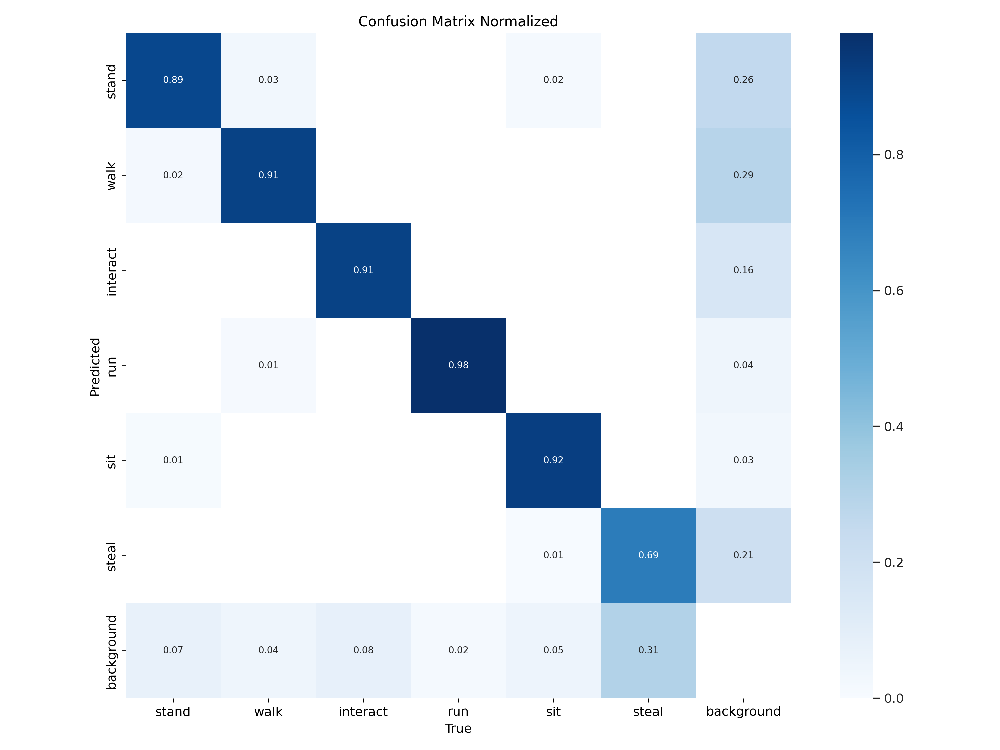

In [9]:
train_run_dir = Result_finalmodel.save_dir

display(Image(filename=os.path.join(train_run_dir, 'confusion_matrix_normalized.png')))

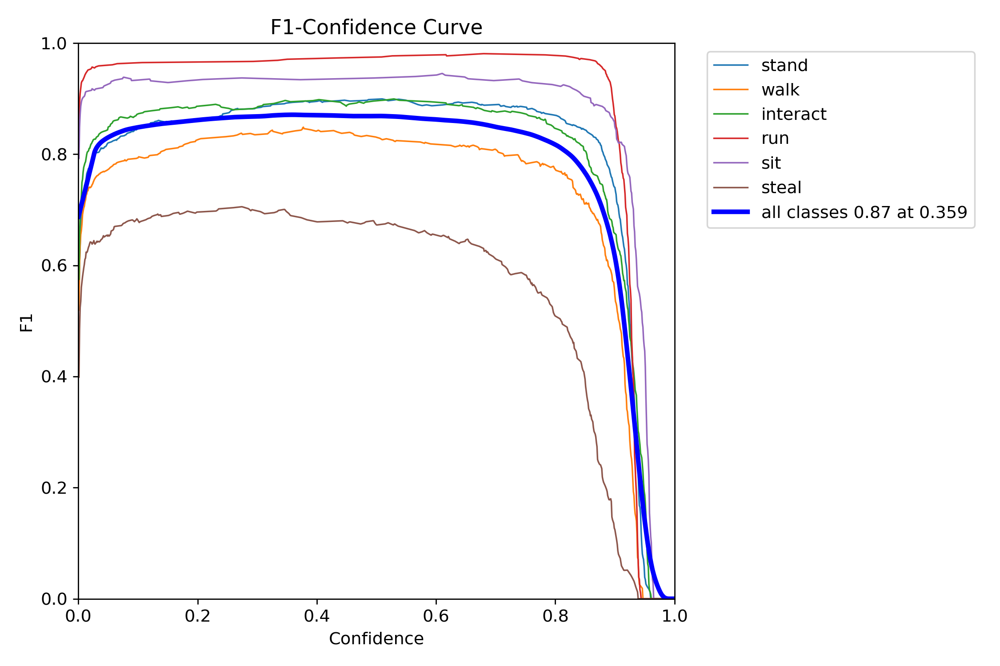

In [10]:
display(Image(filename=os.path.join(train_run_dir, 'F1_curve.png')))

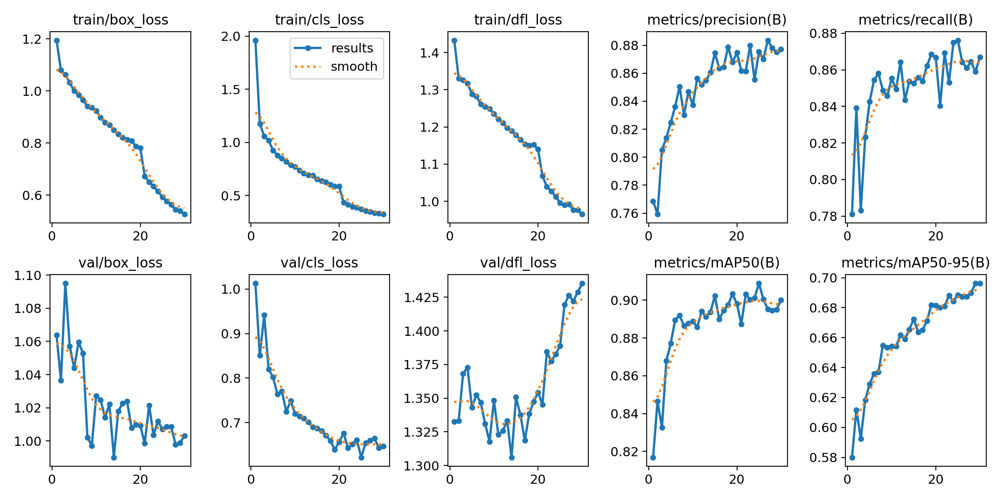

In [11]:
display(Image(filename=os.path.join(train_run_dir, 'results.png')))

# Inference

In [12]:
best_model_path = os.path.join(train_run_dir, 'weights/best.pt')
best_model = YOLO(best_model_path)
metrics = best_model.val(split='test')

Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12s summary (fused): 376 layers, 9,076,530 parameters, 0 gradients, 19.3 GFLOPs


val: Scanning /content/Human-Action-Recognition-1/test/labels... 424 images, 1 backgrounds, 0 corrupt: 100%|██████████| 424/424 [00:00<00:00, 614.40it/s]

val: New cache created: /content/Human-Action-Recognition-1/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:10<00:00,  2.69it/s]


                   all        424        673      0.883      0.874      0.904      0.711
                 stand        114        148        0.9      0.905      0.937      0.772
                  walk         43         87      0.818      0.897      0.896       0.69
              interact        115        119      0.895      0.891      0.947      0.756
                   run         38        120      0.968      0.995      0.992      0.898
                   sit         66         89      0.952      0.895      0.961      0.851
                 steal        106        110      0.765      0.664       0.69      0.297
Speed: 0.2ms preprocess, 15.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val


In [13]:
print("Metrik performa pada Test Set")
print("-" * 60)

print("Tinjauan Performa Training per Epoch:")
results_path = os.path.join(train_run_dir, 'results.csv')
try:
    results_df = pd.read_csv(results_path)
    results_df.columns = results_df.columns.str.strip()

    desired_columns = [
        'epoch', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
        'metrics/mAP50-95(B)', 'val/precision(B)', 'val/recall(B)', 'val/mAP50(B)', 'val/mAP50-95(B)'
    ]
    columns_to_show = [col for col in desired_columns if col in results_df.columns]

    print("\nHasil Training:")
    if not columns_to_show:
        print("Tidak ada kolom metrik yang bisa ditampilkan dari results.csv.")
    else:
        print(results_df[columns_to_show].round(4))

except Exception as e:
    print(f"Tidak dapat membaca atau memproses file results.csv: {e}")


print("\n" + "-" * 60 + "\n")

print(f"Metrik Kinerja Final dari Model Terbaik pada Test Set:")
precision = metrics.box.p[0]
recall = metrics.box.r[0]
f1_score = metrics.box.f1[0]
map50 = metrics.box.map50
map_full = metrics.box.map

print(f"   - \033[1mPrecision:\033[0m            {precision:.4f}")
print(f"   - \033[1mRecall:\033[0m               {recall:.4f}")
print(f"   - \033[1mF1-Score:\033[0m             {f1_score:.4f}")
print(f"   - \033[1mmap50:\033[0m                {map50:.4f}")
print(f"   - \033[1mmap50:95 (mAP):\033[0m         {map_full:.4f}")

print("\n" + "-" * 60 + "\n")

print("Waktu Eksekusi per Gambar pada Test Set (rata-rata):")
speed = metrics.speed
preprocess_time = speed['preprocess']
inference_time = speed['inference']
postprocess_time = speed['postprocess']
total_time = preprocess_time + inference_time + postprocess_time

print(f"   - Waktu Pre-process:    {preprocess_time:.2f} ms")
print(f"   - Waktu Inference:      {inference_time:.2f} ms")
print(f"   - Waktu Post-process:   {postprocess_time:.2f} ms")
print(f"   - \033[1mTotal Waktu per Gambar:\033[0m {total_time:.2f} ms")

print("\n" + "-" * 60)

Metrik performa pada Test Set
------------------------------------------------------------
Tinjauan Performa Training per Epoch:

Hasil Training:
    epoch  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0       1                0.7686             0.7810            0.8168   
1       2                0.7592             0.8391            0.8466   
2       3                0.8052             0.7831            0.8326   
3       4                0.8139             0.8232            0.8679   
4       5                0.8247             0.8426            0.8772   
5       6                0.8362             0.8545            0.8896   
6       7                0.8504             0.8581            0.8919   
7       8                0.8302             0.8488            0.8864   
8       9                0.8468             0.8457            0.8878   
9      10                0.8372             0.8553            0.8888   
10     11                0.8562             0.8494            

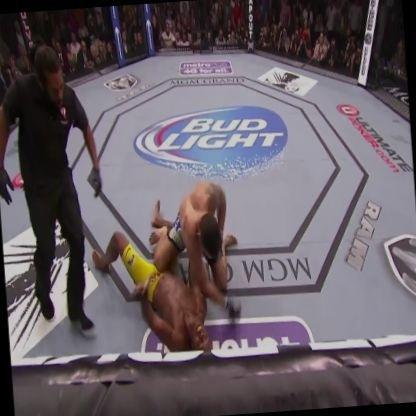


image 1/1 /content/Human-Action-Recognition-1/test/images/img_12343_jpg.rf.e9700a2424cfdbd5dad1d800bc925824.jpg: 640x640 1 interact, 22.4ms
Speed: 4.7ms preprocess, 22.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


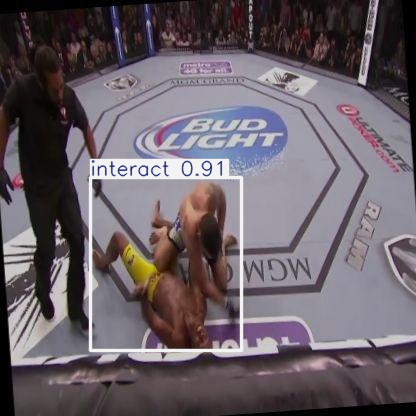

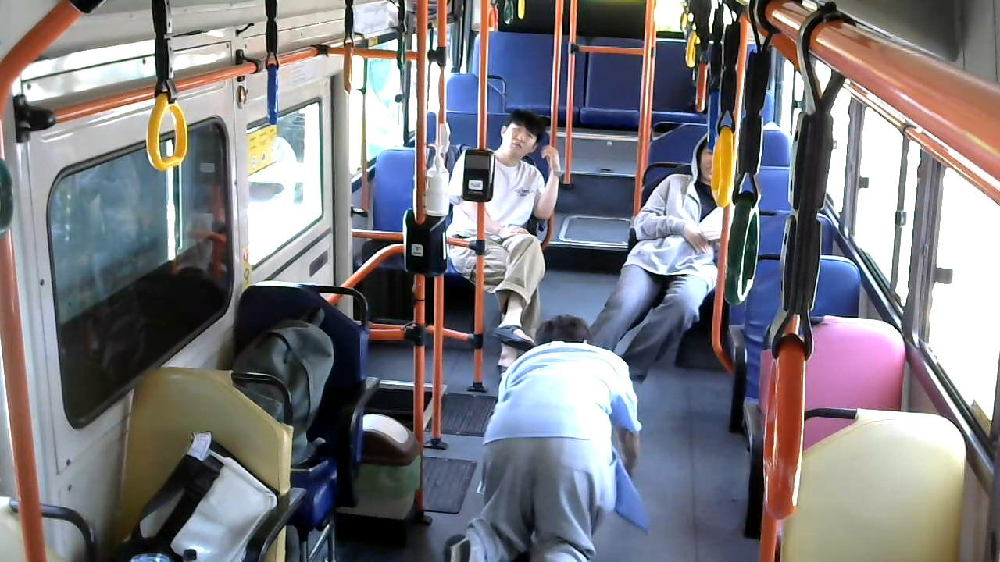


image 1/1 /content/Human-Action-Recognition-1/test/images/WIN_20230525_12_39_43_Pro_mp4-292_jpg.rf.6fdc57c976a64540d80bc557a455eeb9.jpg: 384x640 2 sits, 95.0ms
Speed: 2.5ms preprocess, 95.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


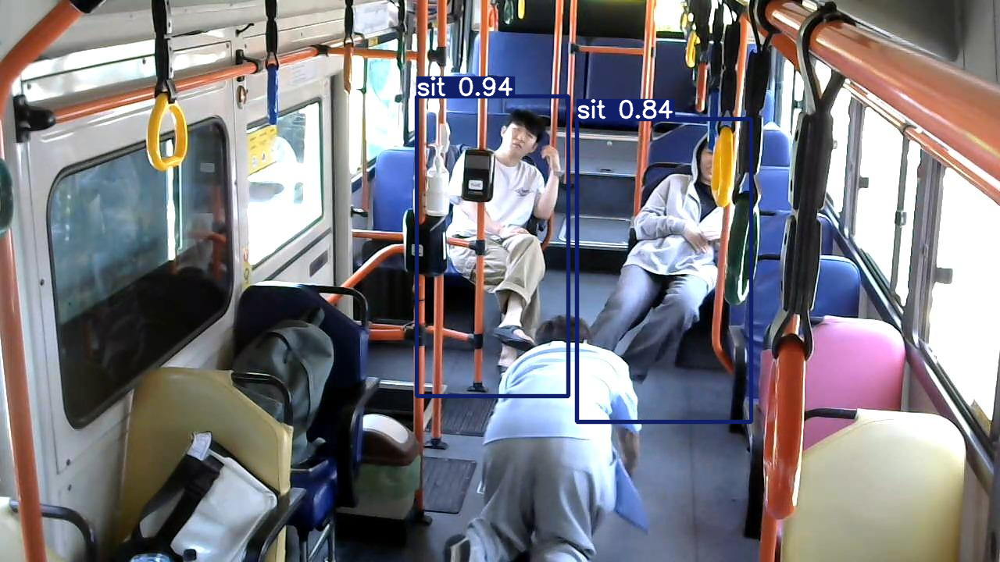

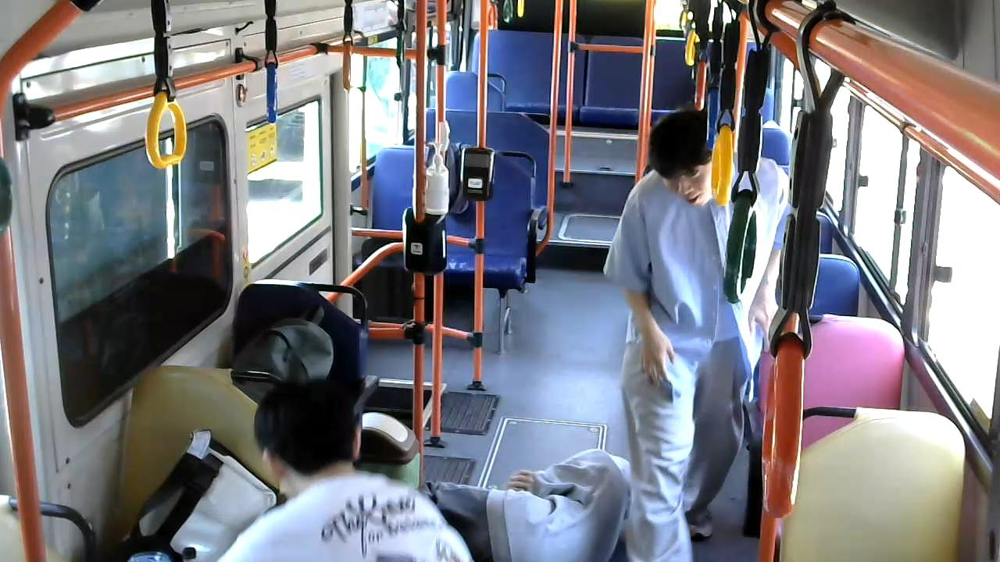


image 1/1 /content/Human-Action-Recognition-1/test/images/WIN_20230525_12_39_43_Pro_mp4-125_jpg.rf.e312e796a036fad081126ac81f1209fc.jpg: 384x640 1 stand, 22.1ms
Speed: 2.3ms preprocess, 22.1ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)


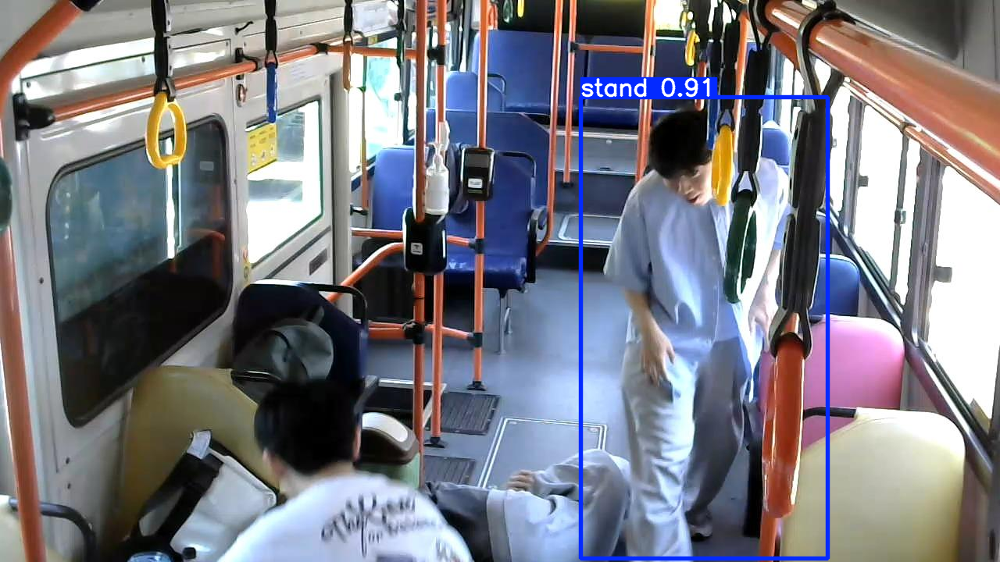

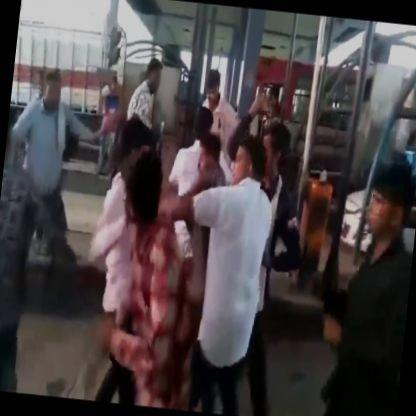


image 1/1 /content/Human-Action-Recognition-1/test/images/img_8632_jpg.rf.5e512dff7e9c949a3c5be605dd60c129.jpg: 640x640 1 interact, 33.7ms
Speed: 3.8ms preprocess, 33.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


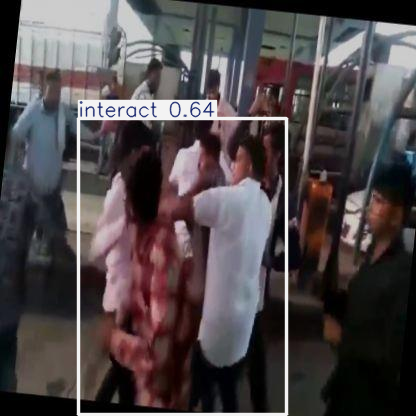

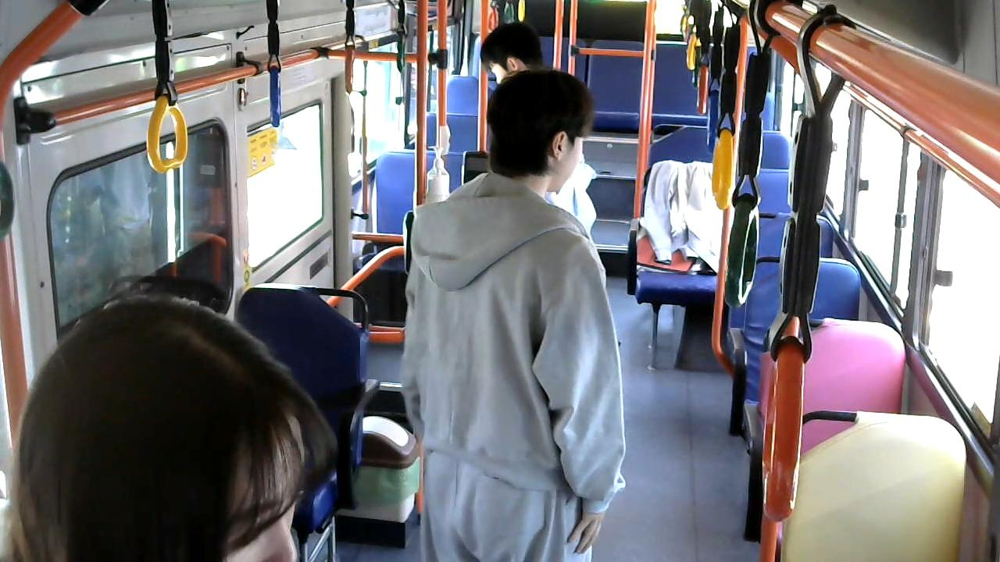


image 1/1 /content/Human-Action-Recognition-1/test/images/WIN_20230525_12_39_43_Pro_mp4-1498_jpg.rf.506a15fec3350c7708cfd25fc90cb739.jpg: 384x640 1 stand, 24.2ms
Speed: 6.4ms preprocess, 24.2ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)


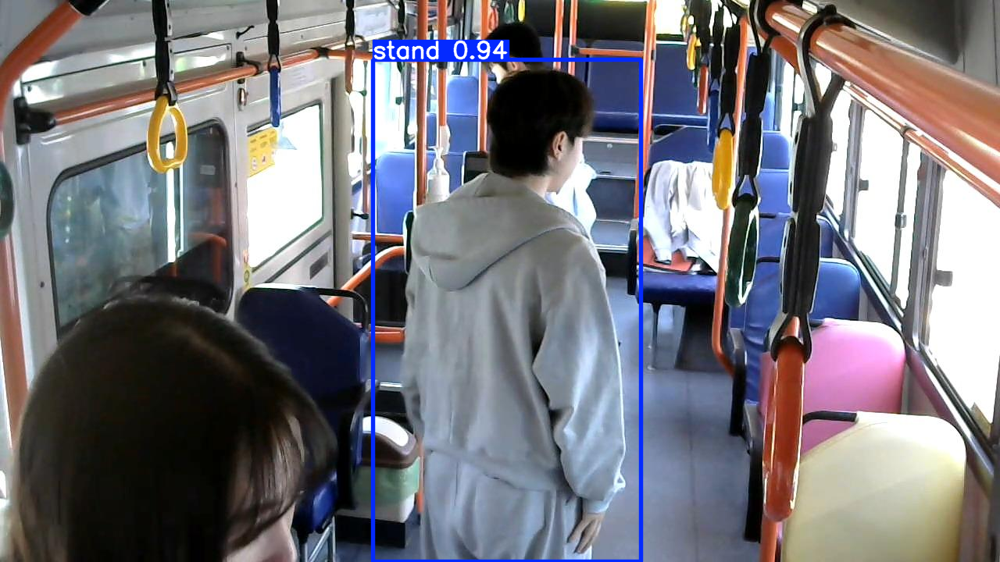

In [14]:
from PIL import Image as PILImage

image_dir = test_path
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir)]
random_images = random.sample(image_files, k=5)

save_dir = os.path.join(project_save_dir, 'yolo_predictions')
os.makedirs(save_dir, exist_ok=True)

for image_path in random_images:
    original_image = PILImage.open(image_path)
    display(original_image)

    results = best_model.predict(source=image_path, save=False)

    plot = results[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(PILImage.fromarray(plot))